# Editing latent vectors.

Reference: https://github.com/woctezuma/stylegan2-projecting-images

## Requirements

### Switch to Tensorflow 1.x

The default TensorFlow version in Colab switched from  1.x to 2.x on the 27th of March, 2020.

Reference: https://colab.research.google.com/notebooks/tensorflow_version.ipynb

We switch to version 1.x to avoid the following error:
> `ModuleNotFoundError: No module named 'tensorflow.contrib' colab`

In [ ]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


### Install StyleGAN2

Reference: https://github.com/NVlabs/stylegan2

In [ ]:
%cd /content/

/content


In [ ]:
%rm -rf stylegan2/
!git clone https://github.com/woctezuma/stylegan2.git

Cloning into 'stylegan2'...
remote: Enumerating objects: 33, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 175 (delta 18), reused 13 (delta 6), pack-reused 142
Receiving objects: 100% (175/175), 1.57 MiB | 1.76 MiB/s, done.
Resolving deltas: 100% (78/78), done.


In [ ]:
%cd stylegan2/

/content/stylegan2


In [ ]:
!nvcc test_nvcc.cu -o test_nvcc -run

CPU says hello.
GPU says hello.


### Mount Google Drive

In [ ]:
!pip install Google-Colab-Transfer

In [ ]:
import colab_transfer

In [ ]:
colab_transfer.mount_google_drive()

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


## Image data

### Boilerplate display functions

In [ ]:
from PIL import Image 
from IPython.display import display

def display_image_from_file(image_name):
  # Reference: https://stackoverflow.com/a/50723518
  
  image_content = Image.open(image_name)
  display(image_content)

  return

def display_image_from_array(array):
  # Reference: https://gist.github.com/kylemcdonald/2f1b9a255993bf9b2629

  image_content = Image.fromarray(array)
  display(image_content) 

  return    

### Import image data from Google Drive

In [ ]:
%cd /content/stylegan2/

/content/stylegan2


In [ ]:
!rm -rf aligned_images/
!rm -rf generated_images_tiled/
!rm -rf generated_images_no_tiled/

#### Slow (and reliable) data import from Google Drive

The following is slow, but seems to work better thant the fast option with Colab.

In [ ]:
folder_names = [
                 'aligned_images/',
                 'generated_images_tiled/',
                 'generated_images_no_tiled/',
]

for folder_name in folder_names:

  colab_transfer.copy_folder(folder_name=folder_name,
                             source=colab_transfer.get_path_to_home_of_google_drive() + 'stylegan2-projections/',
                             destination=colab_transfer.get_path_to_home_of_local_machine() + 'stylegan2/')

Copying /content/drive/My Drive/stylegan2-projections/aligned_images/ to /content/stylegan2/aligned_images/
Copying /content/drive/My Drive/stylegan2-projections/generated_images_tiled/ to /content/stylegan2/generated_images_tiled/
Copying /content/drive/My Drive/stylegan2-projections/generated_images_no_tiled/ to /content/stylegan2/generated_images_no_tiled/


#### Fast (yet unreliable) data import from Google Drive

The following is fast, but I have encountered an issue with Colab: `os.path.exists()` sometimes returns `False`, which messes with `compare_directories()`, even though i) the files are in the folder, and ii) they can be opened with the file explorer of Colab.

In [ ]:
# archive_names = [
#                  'aligned_images.tar.gz',
#                  'generated_images_tiled.tar.gz',
#                  'generated_images_no_tiled.tar.gz',
# ]

# for archive_name in archive_names:

#   colab_transfer.copy_file(file_name=archive_name,
#                            destination=colab_transfer.get_path_to_home_of_local_machine() + 'stylegan2/')

#   !du -sh $archive_name
#   !tar -xf $archive_name

## Find the best projections according to Perceptual Similarity

LPIPS stands for "Learned Perceptual Image Patch Similarity" metric.

**Caveat:**: this is actually a perceptual **loss**!
-   higher means further/more different
-   lower means more similar

Reference: https://github.com/richzhang/PerceptualSimilarity

### Using the PyPI package

This allows to sort images according to perceptual loss.

#### Install

In [ ]:
!pip install lpips

#### Boilerplate comparison function

In [ ]:
# Reference: https://github.com/richzhang/PerceptualSimilarity/blob/master/lpips_2dirs.py

import os
import lpips

def compare_directories(dir0, dir1, net='alex'):
  ## Initializing the model
  loss_fn = lpips.LPIPS(net=net)
  loss_fn.cuda()

  # crawl directories
  files = os.listdir(dir0)

  pairwise_distances = dict()

  for file in files:
    if(os.path.exists(os.path.join(dir1,file))):
      # Load images
      img0 = lpips.im2tensor(lpips.load_image(os.path.join(dir0,file))) # RGB image from [-1,1]
      img1 = lpips.im2tensor(lpips.load_image(os.path.join(dir1,file)))
      img0 = img0.cuda()
      img1 = img1.cuda()

      # Compute distance
      dist01 = loss_fn.forward(img0,img1)
      pairwise_distances[file] = float(dist01)
    else:
      print('Missing file {} from {}'.format(file, dir1))

  return pairwise_distances

#### Boilerplate ranking function

In [ ]:
def print_ranking(pairwise_distances, verbose=True):

  sorted_results = sorted(pairwise_distances,
                          key=lambda x: pairwise_distances[x])

  if verbose:
    print('LPIPS\tImage')
    print('-'*5 + '\t' + '-'*5)

    for element in sorted_results:
      print('{:.2f}\t{}'.format(pairwise_distances[element],
                                element))

  return sorted_results

#### A) Run for `--tiled` projections

In [ ]:
dir0 = '/content/stylegan2/aligned_images/'
dir1 = '/content/stylegan2/generated_images_tiled/'

pairwise_distances_tiled = compare_directories(dir0, dir1, net='vgg')

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.6/dist-packages/lpips/weights/v0.1/vgg.pth
Missing file Christophe_Castaner_Besançon_13-03-2019_Toufik-de-Planoise_1_02.png from /content/stylegan2/generated_images_tiled/
Missing file Mona_Lisa,_by_Leonardo_da_Vinci,_from_C2RMF_retouched_02.png from /content/stylegan2/generated_images_tiled/


In [ ]:
results_tiled = print_ranking(pairwise_distances_tiled)

LPIPS	Image
-----	-----
0.38	Marlène_Schiappa_à_la_tribune_de_l'ONU_(cropped)_01.png
0.38	Offdg_(cropped)_01.png
0.39	emmanuel-macron_01.png
0.39	Adrien_taquet_16467_01.png
0.40	Sébastien_Lecornu,_2017_(cropped)_01.png
0.40	Laurent_Nuñez_01.png
0.41	Amélie_de_Montchalin_(cropped)_01.png
0.41	Laurent_Pietraszewski_2017_01.png
0.43	Julien_Denormandie_2018_(cropped)_01.png
0.43	Portrait_de_Christelle_Dubos_(cropped)_01.png
0.43	Franck_Riester_2019_(cropped)_01.png
0.44	Brune_Poirson_02_(cropped)_01.png
0.44	Portrait_d'Annick_Girardin_(cropped)_01.png
0.44	Nicole_Belloubet,_Ministre_de_la_Justice_2018_01.png
0.44	Gérald_Darmanin_2019_(cropped)_01.png
0.44	20190401_Cedric_O_Portraits_PhotoGézelinGrée_02_01.png
0.45	Christophe_Castaner_Besançon_13-03-2019_Toufik-de-Planoise_1_01.png
0.45	Sophie_Cluzel_2018-04-06_lancement_stratégie_autisme_2018-2022_(3)_01.png
0.45	PERÚ_Y_FRANCIA_FIRMARON_IMPORTANTES_ACUERDOS_DE_COOPERACIÓN_EN_DEFENSA_(10678701576)-cropped_01.png
0.45	Jean-Baptis

#### B) Run for `--no-tiled` projections

In [ ]:
dir0 = '/content/stylegan2/aligned_images/'
dir1 = '/content/stylegan2/generated_images_no_tiled'

pairwise_distances_no_tiled = compare_directories(dir0, dir1, net='vgg')

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.6/dist-packages/lpips/weights/v0.1/vgg.pth
Missing file Christophe_Castaner_Besançon_13-03-2019_Toufik-de-Planoise_1_02.png from /content/stylegan2/generated_images_no_tiled
Missing file Mona_Lisa,_by_Leonardo_da_Vinci,_from_C2RMF_retouched_02.png from /content/stylegan2/generated_images_no_tiled


In [ ]:
results_no_tiled = print_ranking(pairwise_distances_no_tiled)

LPIPS	Image
-----	-----
0.31	Marlène_Schiappa_à_la_tribune_de_l'ONU_(cropped)_01.png
0.34	Portrait_de_Christelle_Dubos_(cropped)_01.png
0.35	Adrien_taquet_16467_01.png
0.36	Laurent_Nuñez_01.png
0.36	emmanuel-macron_01.png
0.36	Offdg_(cropped)_01.png
0.37	Jean-Baptiste_Djebbari_-_2019_(cropped)_01.png
0.37	Sébastien_Lecornu,_2017_(cropped)_01.png
0.39	Laurent_Pietraszewski_2017_01.png
0.40	Gérald_Darmanin_2019_(cropped)_01.png
0.40	Portrait_d'Annick_Girardin_(cropped)_01.png
0.40	Julien_Denormandie_2018_(cropped)_01.png
0.41	Christophe_Castaner_Besançon_13-03-2019_Toufik-de-Planoise_1_01.png
0.41	PERÚ_Y_FRANCIA_FIRMARON_IMPORTANTES_ACUERDOS_DE_COOPERACIÓN_EN_DEFENSA_(10678701576)-cropped_01.png
0.41	Agnès_Pannier-Runacher_2019_01.png
0.41	Brune_Poirson_02_(cropped)_01.png
0.42	Gabriel_Attal_02_(cropped)_01.png
0.42	Jean-Baptiste_Lemoyne_(cropped)_01.png
0.42	Florence_Parly_2017_(cropped)_01.png
0.42	Franck_Riester_2019_(cropped)_01.png
0.42	Nicole_Belloubet,_Ministre_de_la_Just

### Using the script from the Github directory

This allows to compute the loss between all corresponding pairs of images in 2 directories.

**Caveat**: the `net` is set to `alex` here, whereas we could use `vgg` above.

#### Install

In [ ]:
%cd /content/

/content


In [ ]:
%rm -rf PerceptualSimilarity/
!git clone https://github.com/richzhang/PerceptualSimilarity.git

Cloning into 'PerceptualSimilarity'...
remote: Enumerating objects: 59, done.
remote: Counting objects: 100% (59/59), done.
remote: Compressing objects: 100% (45/45), done.
remote: Total 683 (delta 32), reused 32 (delta 14), pack-reused 624
Receiving objects: 100% (683/683), 8.74 MiB | 21.10 MiB/s, done.
Resolving deltas: 100% (395/395), done.


#### Run

In [ ]:
%cd PerceptualSimilarity

/content/PerceptualSimilarity


##### A) Run for `-tiled` projections

In [ ]:
# !python lpips_2dirs.py --use_gpu \
#  -d0 /content/stylegan2/aligned_images \
#  -d1 /content/stylegan2/generated_images_tiled \
#  -o lpips_tiled.txt 

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-4df8aa71.pth
100% 233M/233M [00:07<00:00, 33.6MB/s]
Loading model from: /content/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
libpng warning: iCCP: known incorrect sRGB profile
Amélie_de_Montchalin_(cropped)_01.png: 0.242
Informal_meeting_of_energy_and_transport_ministers_(TTE)._Arrivals,_transport_ministers_Elisabeth_Borne_(37190062412)_(cropped)_01.png: 0.346
Laurent_Pietraszewski_2017_01.png: 0.327
Laurent_Nuñez_01.png: 0.274
libpng warning: iCCP: known incorrect sRGB profile
Olivier_Véran_-_Juillet_2012_01.png: 0.328
Franck_Riester_2019_(cropped)_01.png: 0.310
libpng warning: iCCP: known incorrect sRGB profile
Offdg_(cropped)_01.png: 0.236
Marc5_(4305630213)_01.png: 0.370
libpng warning: iCCP: known incorrect sRGB profile
Roxana_Maracineanu_-_2018_(cropped)_01.png: 0.398
Marlène_

##### B) Run for `--no-tiled` projections

In [ ]:
# !python lpips_2dirs.py --use_gpu \
#  -d0 /content/stylegan2/aligned_images \
#  -d1 /content/stylegan2/generated_images_no_tiled \
#  -o lpips_no_tiled.txt 

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /content/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
libpng warning: iCCP: known incorrect sRGB profile
Amélie_de_Montchalin_(cropped)_01.png: 0.239
Informal_meeting_of_energy_and_transport_ministers_(TTE)._Arrivals,_transport_ministers_Elisabeth_Borne_(37190062412)_(cropped)_01.png: 0.320
Laurent_Pietraszewski_2017_01.png: 0.265
Laurent_Nuñez_01.png: 0.198
libpng warning: iCCP: known incorrect sRGB profile
Olivier_Véran_-_Juillet_2012_01.png: 0.278
Franck_Riester_2019_(cropped)_01.png: 0.290
libpng warning: iCCP: known incorrect sRGB profile
Offdg_(cropped)_01.png: 0.186
Marc5_(4305630213)_01.png: 0.270
libpng warning: iCCP: known incorrect sRGB profile
Roxana_Maracineanu_-_2018_(cropped)_01.png: 0.349
Marlène_Schiappa_à_la_tribune_de_l'ONU_(cropped)_01.png: 0.158
Mona_Lisa,_by_Leonardo_da_Vinci,_from_C2RMF_retouched_01.png: 0.434
emmanuel-macron_01.png: 0.248
Meisje_met_de_parel_01.p

## Applications

Reference: https://gist.github.com/woctezuma/139cedb92a94c5ef2675cc9f06851b31

In [ ]:
%cd /content/stylegan2/

/content/stylegan2


### Boilerplate functions

In [ ]:
def redirect_image_name_to_npy(image_name):
  npy_name = image_name.replace('.png', '.npy')

  return npy_name

In [ ]:
import numpy as np

def load_latent_vector(image_name):
  latent_vector_name = redirect_image_name_to_npy(image_name)

  w = np.load(latent_vector_name)

  w = np.expand_dims(w, axis=0)

  return w

### Load StyleGAN2

In [ ]:
# 1. Set up StyleGAN

import dnnlib
import dnnlib.tflib as tflib
import pretrained_networks

network_pkl = 'gdrive:networks/stylegan2-ffhq-config-f.pkl'
_G, _D, Gs = pretrained_networks.load_networks(network_pkl)

Gs_kwargs = dnnlib.EasyDict()
Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
Gs_kwargs.randomize_noise = False

Gs_syn_kwargs = dnnlib.EasyDict()
Gs_syn_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
Gs_syn_kwargs.randomize_noise = False
Gs_syn_kwargs.minibatch_size = 4

noise_vars = [
    var for name, var in Gs.components.synthesis.vars.items()
    if name.startswith('noise')
]
w_avg = Gs.get_var('dlatent_avg')
truncation_psi = 0.75

Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Compiling... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Compiling... Loading... Done.


### Freeze a list of file names

In [ ]:
import os

dir1 = '/content/stylegan2/generated_images_tiled/'

# Lexicographical order
sorted_file_name_list = sorted([
                                f for f in os.listdir(dir1) 
                                if not f.endswith('.npy')
                                ])

In [ ]:
for i, f in enumerate(sorted_file_name_list):
  print('{:02d}) {}'.format(i, f))

00) 20190401_Cedric_O_Portraits_PhotoGézelinGrée_02_01.png
01) 993px-Ginevra_de'_Benci_-_National_Gallery_of_Art_01.png
02) Adrien_taquet_16467_01.png
03) Agnès_Pannier-Runacher_2019_01.png
04) Amélie_de_Montchalin_(cropped)_01.png
05) Antonello_da_Messina_059_01.png
06) Brune_Poirson_02_(cropped)_01.png
07) Christophe_Castaner_Besançon_13-03-2019_Toufik-de-Planoise_1_01.png
08) Emmanuelle_Wargon_01.png
09) Édouard_Philippe-2_(46824610355)_(cropped)_01.png
10) Florence_Parly_2017_(cropped)_01.png
11) Franck_Riester_2019_(cropped)_01.png
12) Frédérique_Vidal_-_2018_(cropped)_01.png
13) Gabriel_Attal_02_(cropped)_01.png
14) Geneviève_Darrieussecq_-_2017_01.png
15) Gérald_Darmanin_2019_(cropped)_01.png
16) Informal_meeting_of_economic_and_financial_affairs_ministers_(ECOFIN)._Handshake,_Eurogroup_Toomas_Tõniste_and_Bruno_Le_Maire_(36840346850)_(cropped)_01.png
17) Informal_meeting_of_energy_and_transport_ministers_(TTE)._Arrivals,_transport_ministers_Elisabeth_Borne_(3719006241

In [ ]:
file_name = 'emmanuel-macron_01.png'

index_A = sorted_file_name_list.index(file_name)

for offset in [0, 1]:
  print('Index n°{} for {} (if we start indexing at {})'.format(index_A + offset,
                                                                file_name,
                                                                offset))

Index n°41 for emmanuel-macron_01.png (if we start indexing at 0)
Index n°42 for emmanuel-macron_01.png (if we start indexing at 1)


### 1. Morphing

Morphing consists in the linear interpolation of latent vectors.

#### Boilerplate code

In [ ]:
# 3. Render results

from pathlib import Path
import tensorflow as tf
import numpy as np
import PIL.Image

def apply_morphing(index_A,
                   index_B,
                   use_tiled_projector=True,
                   file_extension = '.jpg',
                   n=5,
                   size=256,
                   v_min=0,
                   v_max=1,
                   truncation_psi=None,
                   verbose=False):
  output_folder_name = 'morphing/'
  
  if use_tiled_projector:    
    output_folder_name = output_folder_name + 'tiled/'
    input_folder_name = 'generated_images_tiled/'    
  else:
    output_folder_name = output_folder_name + 'no_tiled/'
    input_folder_name = 'generated_images_no_tiled/'
  
  Path(output_folder_name).mkdir(parents=True, exist_ok=True)

  keyword='morphing'

  offset = 1
  output_file_name = '{}{}_{:02d}_{:02d}{}'.format(
      output_folder_name,
      keyword,
      index_A + offset,
      index_B + offset,
      file_extension)

  image_name_A = input_folder_name + sorted_file_name_list[index_A]
  image_name_B = input_folder_name + sorted_file_name_list[index_B]

  w_A = load_latent_vector(image_name_A)
  w_B = load_latent_vector(image_name_B)

  canvas = PIL.Image.new('RGB', (n * size, size))
  for i, u in enumerate(np.linspace(v_min, v_max, n)):
    w_new = w_A * (1-u) + w_B * u

    if truncation_psi is not None:
      w_new = w_avg + (w_new - w_avg) * truncation_psi

    image = Gs.components.synthesis.run(w_new, **Gs_syn_kwargs)[0]

    image = PIL.Image.fromarray(image)
    image = image.resize((size, size), PIL.Image.LANCZOS)
    canvas.paste(image, (i * size, 0))

  if verbose:
    print('Saving {}'.format(output_file_name))
  canvas.save(output_file_name)

  return

In [ ]:
def morph_vs_all(reference_index,
                 truncation_psi=None):

  for use_tiled_projector in [True, False]:
    for index_B in range(len(sorted_file_name_list)):

      if index_B == reference_index:
        continue

      apply_morphing(index_A=reference_index,
                     index_B=index_B,
                     use_tiled_projector=use_tiled_projector,
                     truncation_psi=truncation_psi)
      
  return  

#### Run

In [ ]:
# NB: set psi to None or to 1 to disable truncation
truncation_psi = None

if truncation_psi is not None:
  assert(0<=truncation_psi and truncation_psi<=1)

print('Truncation psi = {}'.format(truncation_psi))  

Truncation psi = None


In [ ]:
# Emmanuel Macron
morph_vs_all(reference_index=41,
             truncation_psi=truncation_psi)

In [ ]:
# Brune Poirson
morph_vs_all(reference_index=6,
             truncation_psi=truncation_psi)

#### Display

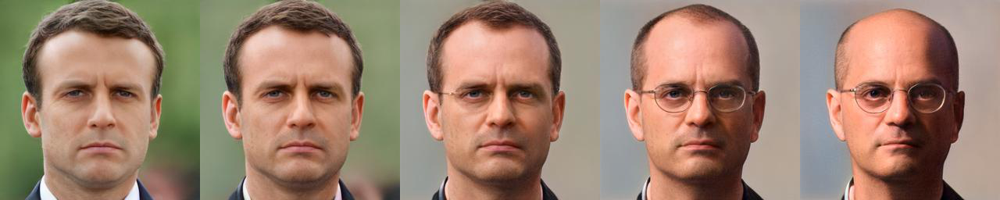

In [ ]:
display_image_from_file('morphing/no_tiled/morphing_42_22.jpg')

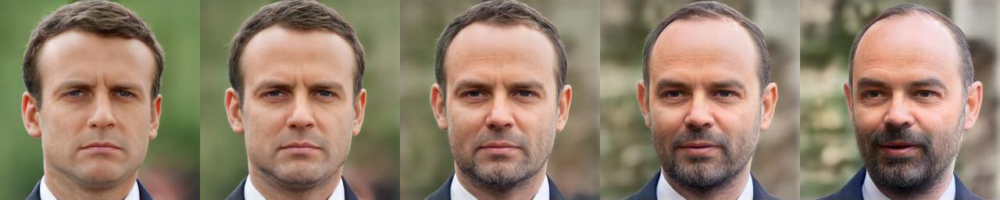

In [ ]:
display_image_from_file('morphing/no_tiled/morphing_42_10.jpg')

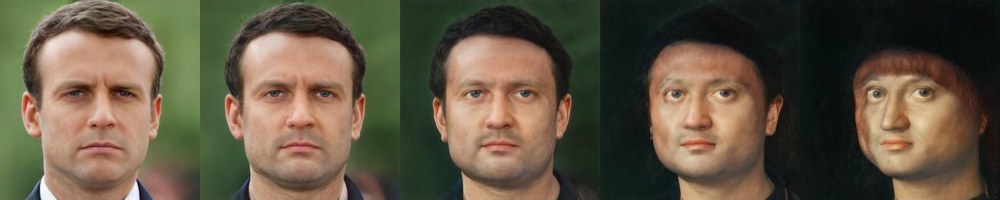

In [ ]:
display_image_from_file('morphing/no_tiled/morphing_42_06.jpg')

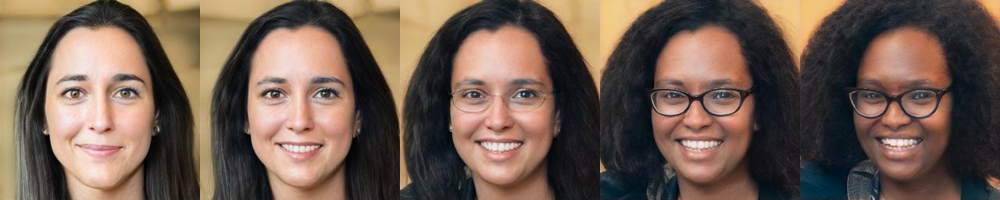

In [ ]:
display_image_from_file('morphing/no_tiled/morphing_07_39.jpg')

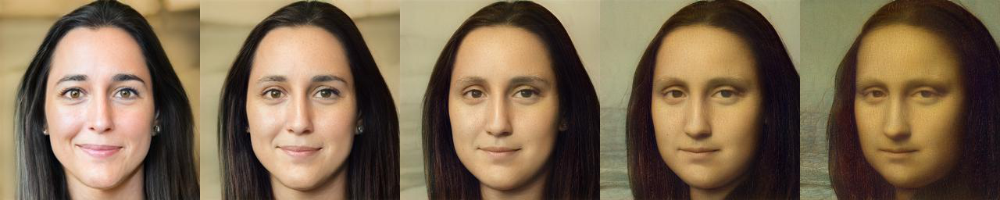

In [ ]:
display_image_from_file('morphing/no_tiled/morphing_07_29.jpg')

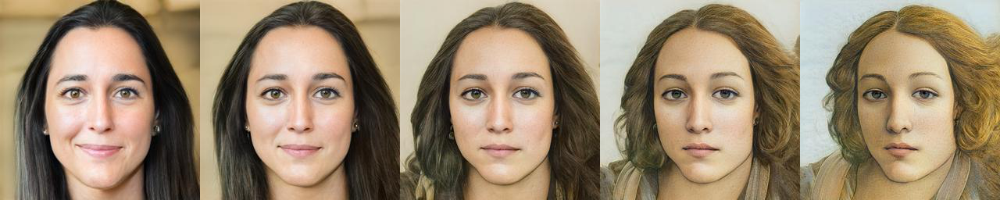

In [ ]:
display_image_from_file('morphing/no_tiled/morphing_07_41.jpg')

#### Export

In [ ]:
!rm morphing.tar.gz
!tar -cf morphing.tar.gz morphing/

### 2. Style transfer

Style transfer consists in a cross-over of latent vectors at the layer level.

#### Boilerplate code

Reference: https://github.com/NVlabs/stylegan2/blob/cec605e0834de5404d5c7e5cead7053bdd0e4dde/run_generator.py#L40

In [ ]:
import re

def _parse_num_range(s):
    '''Accept either a comma separated list of numbers 'a,b,c' or a range 'a-c' and return as a list of ints.'''

    range_re = re.compile(r'^(\d+)-(\d+)$')
    m = range_re.match(s)
    if m:
        return list(range(int(m.group(1)), int(m.group(2))+1))
    vals = s.split(',')
    return [int(x) for x in vals]

print(_parse_num_range('0-6'))

[0, 1, 2, 3, 4, 5, 6]


In [ ]:
def apply_style_mixing(row_seeds,
                       col_seeds, 
                       use_tiled_projector=True,
                       file_extension = '.jpg',
                       truncation_psi=None,
                       col_styles=None):
    output_folder_name = 'style_mixing/'
    
    if use_tiled_projector:    
      output_folder_name = output_folder_name + 'tiled/'
      input_folder_name = 'generated_images_tiled/'    
    else:
      output_folder_name = output_folder_name + 'no_tiled/'
      input_folder_name = 'generated_images_no_tiled/'
    
    Path(output_folder_name).mkdir(parents=True, exist_ok=True)

    keyword='style_mixing'

    offset = 1
    output_file_name = '{}{}_{}_{}{}'.format(
        output_folder_name,
        keyword,
        '-'.join(['{:02d}'.format(id + offset) for id in row_seeds]),
        '-'.join(['{:02d}'.format(id + offset) for id in col_seeds]),
        file_extension)
    
    if col_styles is None:
      col_styles_as_str = '0-6'
      col_styles = _parse_num_range(col_styles_as_str)    

    print('Loading W vectors...')
    all_seeds = list(set(row_seeds + col_seeds))

    all_w_as_list = []    
    for id in all_seeds:      
      current_image_name = input_folder_name + sorted_file_name_list[id]
      current_w = load_latent_vector(current_image_name) # [1, layer, component]
      all_w_as_list.append(current_w)

    all_w = np.concatenate(all_w_as_list) # [minibatch, layer, component]

    if truncation_psi is not None:
      all_w = w_avg + (all_w - w_avg) * truncation_psi # [minibatch, layer, component]
    w_dict = {seed: w for seed, w in zip(all_seeds, list(all_w))} # [layer, component]

    print('Generating images...')
    all_images = Gs.components.synthesis.run(all_w, **Gs_syn_kwargs) # [minibatch, height, width, channel]
    image_dict = {(seed, seed): image for seed, image in zip(all_seeds, list(all_images))}

    print('Generating style-mixed images...')
    for row_seed in row_seeds:
        for col_seed in col_seeds:
            w = w_dict[row_seed].copy()
            w[col_styles] = w_dict[col_seed][col_styles]
            image = Gs.components.synthesis.run(w[np.newaxis], **Gs_syn_kwargs)[0]
            image_dict[(row_seed, col_seed)] = image

    print('Saving images...')
    for (row_seed, col_seed), image in image_dict.items():
        PIL.Image.fromarray(image, 'RGB').save(dnnlib.make_run_dir_path('%d-%d.png' % (row_seed, col_seed)))

    print('Saving image grid...')
    _N, _C, H, W = Gs.output_shape
    canvas = PIL.Image.new('RGB', (W * (len(col_seeds) + 1), H * (len(row_seeds) + 1)), 'black')
    for row_idx, row_seed in enumerate([None] + row_seeds):
        for col_idx, col_seed in enumerate([None] + col_seeds):
            if row_seed is None and col_seed is None:
                continue
            key = (row_seed, col_seed)
            if row_seed is None:
                key = (col_seed, col_seed)
            if col_seed is None:
                key = (row_seed, row_seed)
            canvas.paste(PIL.Image.fromarray(image_dict[key], 'RGB'), (W * col_idx, H * row_idx))
    canvas.save(dnnlib.make_run_dir_path(output_file_name))

    return

#### Run

In [ ]:
%cd /content/stylegan2/

/content/stylegan2


In [ ]:
# NB: set psi to None or to 1 to disable truncation
truncation_psi = 0.75

if truncation_psi is not None:
  assert(0<=truncation_psi and truncation_psi<=1)

print('Truncation psi = {}'.format(truncation_psi))  

Truncation psi = 0.75


In [ ]:
row_seeds = [41, 6, 9, 28, 40]
col_seeds = [41, 6, 21, 38]

for use_tiled_projector in [True, False]:
  apply_style_mixing(row_seeds,
                    col_seeds, 
                    use_tiled_projector=use_tiled_projector,
                    truncation_psi=truncation_psi)

Loading W vectors...
Generating images...
Generating style-mixed images...
Saving images...
Saving image grid...
Loading W vectors...
Generating images...
Generating style-mixed images...
Saving images...
Saving image grid...


#### Display

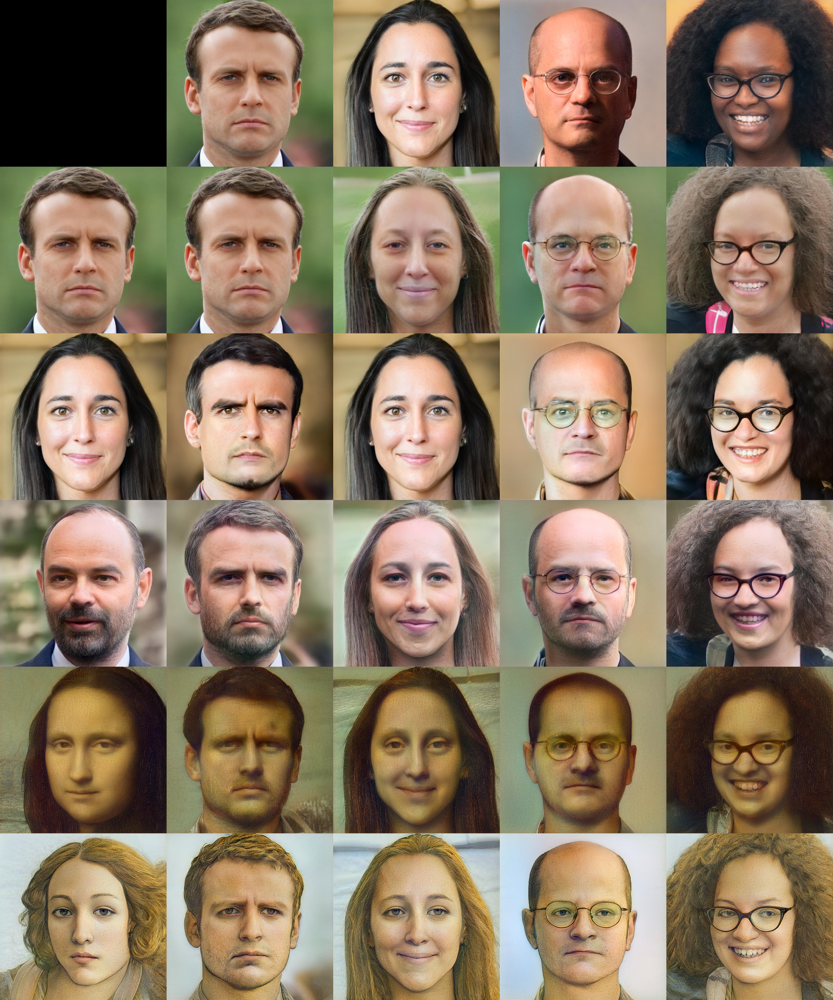

In [ ]:
from IPython.display import Image

image_name = 'style_mixing/no_tiled/style_mixing_42-07-10-29-41_42-07-22-39.jpg'

Image(image_name)

#### Export

In [ ]:
!rm style_mixing.tar.gz
!tar -cf style_mixing.tar.gz style_mixing/

### 3. Expression transfer

Expression transfer consists in the addition of:
- a latent vector,
- a scaled difference vector.

References:
- code: https://gist.github.com/woctezuma/139cedb92a94c5ef2675cc9f06851b31
- directions: https://github.com/a312863063/generators-with-stylegan2

#### Import directions for expressions



In [ ]:
%cd /content/

/content


In [ ]:
!rm -rf generators-with-stylegan2/
!git clone https://github.com/a312863063/generators-with-stylegan2.git

Cloning into 'generators-with-stylegan2'...
remote: Enumerating objects: 175, done.
remote: Counting objects: 100% (175/175), done.
remote: Compressing objects: 100% (175/175), done.
remote: Total 606 (delta 104), reused 0 (delta 0), pack-reused 431
Receiving objects: 100% (606/606), 27.36 MiB | 9.04 MiB/s, done.
Resolving deltas: 100% (307/307), done.


In [ ]:
%cd /content/stylegan2/

/content/stylegan2


#### Boilerplate code

In [ ]:
def get_expression_folder_name():
  expression_folder_name = '/content/generators-with-stylegan2/latent_directions/'

  return expression_folder_name

In [ ]:
def get_expression_vector_file_name(expression_name):
  input_expression_folder_name = get_expression_folder_name()
  expression_vector_file_name = input_expression_folder_name + expression_name + '.npy'

  return expression_vector_file_name

In [ ]:
# 3. Render results

from pathlib import Path
import tensorflow as tf
import numpy as np
import PIL.Image

def apply_expression(index_A,
                    expression_name,
                    use_tiled_projector=True,
                    file_extension = '.jpg',
                    n=5,
                    size=256,
                    v_min=-10,
                    v_max=10,
                    truncation_psi=None,
                    verbose=False):
  output_folder_name = 'expression/'
  
  if use_tiled_projector:    
    output_folder_name = output_folder_name + 'tiled/'
    input_folder_name = 'generated_images_tiled/'    
  else:
    output_folder_name = output_folder_name + 'no_tiled/'
    input_folder_name = 'generated_images_no_tiled/'
  
  Path(output_folder_name).mkdir(parents=True, exist_ok=True)

  keyword='expression'

  offset = 1
  output_file_name = '{}{}_{:02d}_{}{}'.format(
      output_folder_name,
      keyword,
      index_A + offset,
      expression_name,
      file_extension)

  image_name_A = input_folder_name + sorted_file_name_list[index_A]
  expression_vector_file_name = get_expression_vector_file_name(expression_name)

  w_A = load_latent_vector(image_name_A)
  v_expression = np.load(expression_vector_file_name)

  canvas = PIL.Image.new('RGB', (n * size, size))
  for i, u in enumerate(np.linspace(v_min, v_max, n)):
    w_new = w_A + u * v_expression

    if truncation_psi is not None:
      w_new = w_avg + (w_new - w_avg) * truncation_psi

    image = Gs.components.synthesis.run(w_new, **Gs_syn_kwargs)[0]

    image = PIL.Image.fromarray(image)
    image = image.resize((size, size), PIL.Image.LANCZOS)
    canvas.paste(image, (i * size, 0))

  if verbose:
    print('Saving {}'.format(output_file_name))
  canvas.save(output_file_name)

  return

#### List expressions

In [ ]:
import os

f = get_expression_folder_name()

list_of_expressions = [g.replace('.npy', '') for g in sorted(os.listdir(f))]

print('\n'.join(list_of_expressions))

age
angle_horizontal
angle_pitch
beauty
emotion_angry
emotion_disgust
emotion_easy
emotion_fear
emotion_happy
emotion_sad
emotion_surprise
eyes_open
face_shape
gender
glasses
height
race_black
race_white
race_yellow
smile
width


#### Run

In [ ]:
%cd /content/stylegan2/

/content/stylegan2


In [ ]:
# NB: set psi to None or to 1 to disable truncation
truncation_psi = 0.75

if truncation_psi is not None:
  assert(0<=truncation_psi and truncation_psi<=1)

print('Truncation psi = {}'.format(truncation_psi))

Truncation psi = 0.75


In [ ]:
for use_tiled_projector in [True, False]:
  for expression_name in list_of_expressions:

    # Emmanuel Macron
    apply_expression(index_A=41,
                     expression_name=expression_name,
                     use_tiled_projector=use_tiled_projector,
                     truncation_psi=truncation_psi)

In [ ]:
for use_tiled_projector in [True, False]:
  for expression_name in list_of_expressions:

    # Brune Poirson
    apply_expression(index_A=6,
                     expression_name=expression_name,
                     use_tiled_projector=use_tiled_projector,
                     truncation_psi=truncation_psi)

In [ ]:
for use_tiled_projector in [True, False]:

  # Everybody
  for index_A in range(len(sorted_file_name_list)):
    print('{}/{}'.format(index_A+1, len(sorted_file_name_list)))

    for expression_name in ['race_black', 'smile']:

      apply_expression(index_A=index_A,
                      expression_name=expression_name,
                      use_tiled_projector=use_tiled_projector,
                      truncation_psi=truncation_psi)

#### Display

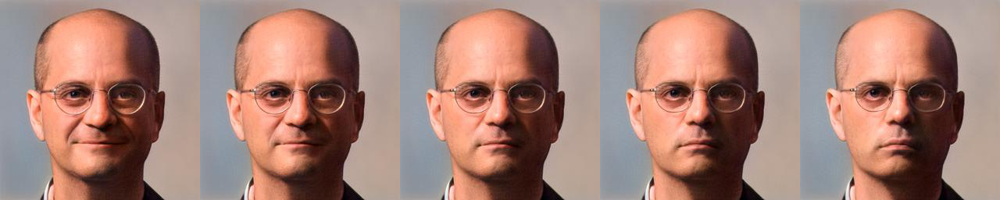

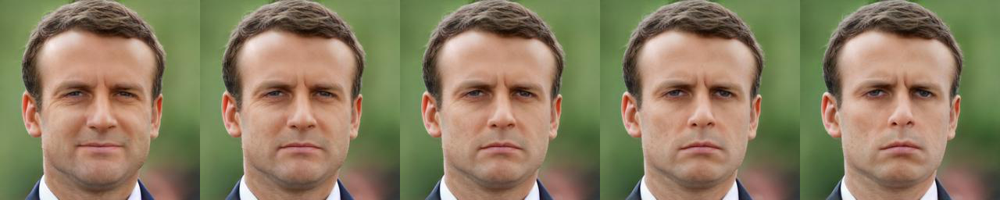

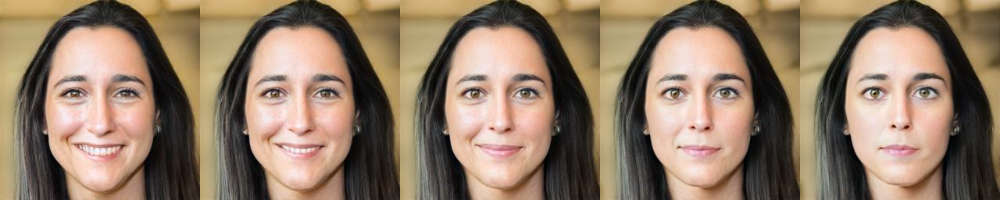

In [ ]:
for id in [22, 42, 7]:
  display_image_from_file('expression/no_tiled/expression_{:02d}_smile.jpg'.format(id))

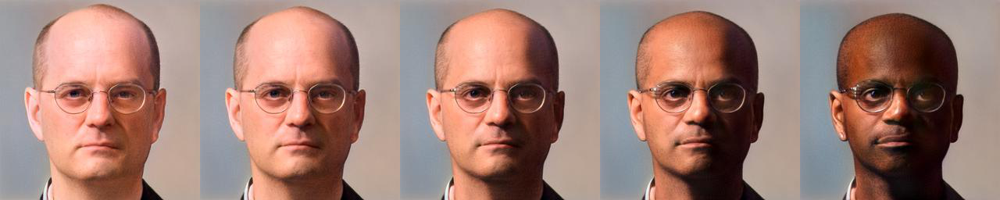

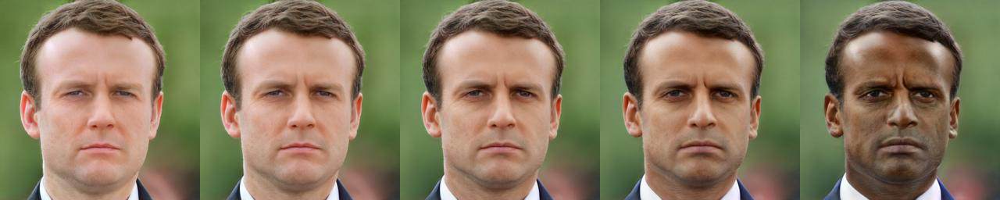

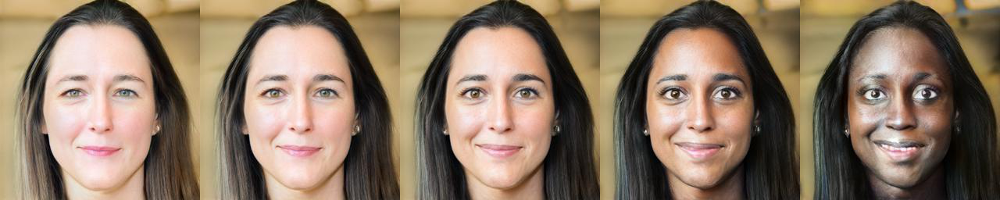

In [ ]:
for id in [22, 42, 7]:
  display_image_from_file('expression/no_tiled/expression_{:02d}_race_black.jpg'.format(id))

#### Export

In [ ]:
!rm expression_transfer.tar.gz
!tar -cf expression_transfer.tar.gz expression/

## Video of style transfer

Reference: https://github.com/justinpinkney/stylegan2/blob/master/grid_vid.py

### Install MoviePy

In [ ]:
pip install moviepy

### Boilerplate code

In [ ]:
import math

def apply_video_style_mixing(row_seeds,
                                col_seeds, 
                                use_tiled_projector=True,
                                truncation_psi=None,
                                num_frames=100,
                                output_folder_name = None,
                                col_styles=None):   
    num_frames = int(num_frames)

    if output_folder_name is None:
      output_folder_name = 'video_style_mixing/'

    if use_tiled_projector:    
      output_folder_name = output_folder_name + 'tiled/'
      input_folder_name = 'generated_images_tiled/'    
    else:
      output_folder_name = output_folder_name + 'no_tiled/'
      input_folder_name = 'generated_images_no_tiled/'

    Path(output_folder_name).mkdir(parents=True, exist_ok=True)
    
    if col_styles is None:
      col_styles_as_str = '0-6'
      col_styles = _parse_num_range(col_styles_as_str)    

    print('Loading W vectors...')
    all_seeds = list(set(row_seeds + col_seeds))

    all_w_as_list = []    
    for id in all_seeds:      
      current_image_name = input_folder_name + sorted_file_name_list[id]
      current_w = load_latent_vector(current_image_name) # [1, layer, component]
      all_w_as_list.append(current_w)

    all_w = np.concatenate(all_w_as_list) # [minibatch, layer, component]

    if truncation_psi is not None:
      all_w = w_avg + (all_w - w_avg) * truncation_psi # [minibatch, layer, component]
    w_dict = {seed: w for seed, w in zip(all_seeds, list(all_w))} # [layer, component]

    print('Generating images...')
    all_images = Gs.components.synthesis.run(all_w, **Gs_syn_kwargs) # [minibatch, height, width, channel]
    image_dict = {(seed, seed): image for seed, image in zip(all_seeds, list(all_images))}

    print('Generating style-mixed images...')
    for row_seed in row_seeds:
        for col_seed in col_seeds:
            w = w_dict[row_seed].copy()
            w[col_styles] = w_dict[col_seed][col_styles]
            image = Gs.components.synthesis.run(w[np.newaxis], **Gs_syn_kwargs)[0]
            image_dict[(row_seed, col_seed)] = image

    min_allowed_t = 0
    max_allowed_t = len(row_seeds)-1

    for t in np.linspace(min_allowed_t, max_allowed_t, num_frames):
      keyword = 'video_style_mixing'
      # Fixed-width formatting of t is required for MoviePy to be able to process files in the right order.
      output_file_name = '{}{}_{:07.3f}.jpg'.format(output_folder_name,
                                                  keyword,
                                                  t)

      t_int = math.floor(t)
      t_next_int = t_int + 1

      # If t is an integer equal to max_allowed_t, we have to fix t_next_int.
      t_next_int = min(t_next_int, max_allowed_t)
      
      ind_A = row_seeds[t_int]
      ind_B = row_seeds[t_next_int]

      w_A = w_dict[ind_A]
      w_B = w_dict[ind_B]

      t_remainder = t - t_int
      w_mix = w_A * (1-t_remainder) + w_B * t_remainder      

      dummy_seed = 0
      frozen_row_seeds = [ dummy_seed ]

      print('Saving image grid {}...'.format(output_file_name))
      _N, _C, H, W = Gs.output_shape
      canvas = PIL.Image.new('RGB', (W * (len(col_seeds) + 1), H * (len(frozen_row_seeds) + 1)), 'black')
      for row_idx, row_seed in enumerate([None] + frozen_row_seeds):
          for col_idx, col_seed in enumerate([None] + col_seeds):
              if row_seed is None and col_seed is None:
                  continue
              # key = (row_seed, col_seed)
              key = None
              if row_seed is None:
                  key = (col_seed, col_seed)
                  current_image = image_dict[key]
              if col_seed is None:
                  # key = (row_seed, row_seed)
                  key = None
                  w = w_mix.copy()
                  current_image = Gs.components.synthesis.run(w[np.newaxis], **Gs_syn_kwargs)[0]                  

              if col_seed is not None and key is None:
                w = w_mix.copy()
                w[col_styles] = w_dict[col_seed][col_styles]
                current_image = Gs.components.synthesis.run(w[np.newaxis], **Gs_syn_kwargs)[0]

              canvas.paste(PIL.Image.fromarray(current_image, 'RGB'), (W * col_idx, H * row_idx))
      canvas.save(dnnlib.make_run_dir_path(output_file_name))

    return 

### Run

In [ ]:
%cd /content/stylegan2/

/content/stylegan2


In [ ]:
# NB: set psi to None or to 1 to disable truncation
truncation_psi = 0.75

if truncation_psi is not None:
  assert(0<=truncation_psi and truncation_psi<=1)

print('Truncation psi = {}'.format(truncation_psi))  

Truncation psi = 0.75


In [ ]:
# To be shared on Google Drive: a more exhaustive version.
row_seeds = [41, 6, 9, 28, 40]
col_seeds = [41, 6, 21, 38]

# To be shown on the README: a smaller version with only 2 columns.
# row_seeds = [41, 6, 9, 21, 38, 28, 40]
# col_seeds = [41, 6]

fps = 25
num_seconds_per_interpolation = 2

output_folder_name = 'video_style_mixing/'
!rm -rf $output_folder_name

# To have a video loop, duplicate the first element and append it to the list:
first_element = row_seeds[0]
row_seeds.append(first_element)

# Compute the required number of frames
num_interpolations = len(row_seeds)-1
num_frames = fps * num_seconds_per_interpolation * num_interpolations

for use_tiled_projector in [True, False]:

  apply_video_style_mixing(row_seeds,
                    col_seeds, 
                    use_tiled_projector=use_tiled_projector,
                    truncation_psi=truncation_psi,
                    num_frames=num_frames,
                    output_folder_name = output_folder_name)

### Aggregate images into a video

In [ ]:
import moviepy.editor as mpy

# fps = 25
# output_folder_name = 'video_style_mixing/'

for use_tiled_projector in [True, False]:

  if use_tiled_projector:
    image_folder = output_folder_name + 'tiled/'
    output_file_name = output_folder_name + 'tiled.mp4'
  else:
    image_folder = output_folder_name + 'no_tiled/'
    output_file_name = output_folder_name + 'no_tiled.mp4'

  my_clip = mpy.ImageSequenceClip(image_folder, fps=fps)
  my_clip.write_videofile(output_file_name)

Done.